In [996]:
import numpy as np
import pandas as pd

In [1015]:
path = "./Data/application_train.csv"
df_loan = pd.read_csv(path)

df_loan.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [1016]:
df_loan = df_loan.drop(columns=['SK_ID_CURR'])
n_samples, n_attrs = df_loan.shape
print("Date shape: ", df_loan.shape)

Date shape:  (307511, 121)


In [1017]:
df_loan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 121 entries, TARGET to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 283.9+ MB


In [1018]:
df_loan.describe()

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,3522.886321,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,-24672.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,-7479.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,-4504.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,-2010.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [1019]:
df_loan['TARGET'].value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

## 1. Fearture Engineering

In [1020]:
objCols = df_loan.select_dtypes(include=['object']).columns
objCols

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
       'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'],
      dtype='object')

### 1-1. Lable Encoding

In [1021]:
# Importing LabelEncoder from Sklearn
# library from preprocessing Module.
from sklearn.preprocessing import LabelEncoder

df_loan_label = df_loan.copy()
# Creating a instance of label Encoder.
le = LabelEncoder()

for col in objCols:
 
    # Using .fit_transform function to fit label
    # encoder and return encoded label
    label = le.fit_transform(df_loan_label[col])

    df_loan_label.drop(col, axis=1, inplace=True)
    df_loan_label[col] = label

# printing Dataframe
df_loan_label.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 121 entries, TARGET to EMERGENCYSTATE_MODE
dtypes: float64(65), int64(56)
memory usage: 283.9 MB


### 1-2. One-Hot Encoding

In [1022]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer

df = df_loan.copy()

transformer = make_column_transformer(
    (OneHotEncoder(), objCols),
    remainder='passthrough')

transformed = transformer.fit_transform(df)
df_loan_ohe = pd.DataFrame(transformed, columns=transformer.get_feature_names())

df_loan_ohe.head()

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.


,onehotencoder__x0_Cash loans,onehotencoder__x0_Revolving loans,onehotencoder__x1_F,onehotencoder__x1_M,onehotencoder__x1_XNA,onehotencoder__x2_N,onehotencoder__x2_Y,onehotencoder__x3_N,onehotencoder__x3_Y,onehotencoder__x4_Children,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
4,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [1023]:
df_loan_ohe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 251 entries, onehotencoder__x0_Cash loans to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(251)
memory usage: 588.9 MB


### 1-3 SMOTE for Imbalanced Data

In [1009]:
from imblearn.over_sampling import SMOTE

In [1024]:
X = df_loan_label.drop(['TARGET'], 1)
y = df_loan_label['TARGET']

X.fillna(X.mean(), inplace=True)
y.fillna(y.mean(), inplace=True)

In [1028]:
oversample = SMOTE(sampling_strategy=0.2)
X, y = oversample.fit_resample(X, y)

## 2. Baseline Models

### 2.1 Prepare the Data

In [1029]:
# split data
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

print("X_train shape: ", X_train.shape)
print("X_test shape: ", X_test.shape)
print("y_train shape: ", y_train.shape)
print("y_test shape: ", y_test.shape)

X_train shape:  (237456, 120)
X_test shape:  (101767, 120)
y_train shape:  (237456,)
y_test shape:  (101767,)


In [1030]:
y_train.value_counts()

0    197888
1     39568
Name: TARGET, dtype: int64

In [1031]:
y_test.value_counts()

0    84798
1    16969
Name: TARGET, dtype: int64

### 2.2 Logistic Regression

In [17]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, mean_squared_error, accuracy_score, log_loss
from sklearn.metrics import plot_confusion_matrix

In [18]:
# construct model
clf = LogisticRegression(solver="liblinear")
name = "LogisticRegression"
model_pipelineBL = Pipeline([(name, clf)])

# fit model & calculate cross val scores
_ = model_pipelineBL.fit(X_train, y_train)
cross_val_scores = cross_val_score(model_pipelineBL, X_train, y_train, cv=5)

# prediction
score_out_of_sample = model_pipelineBL.score(X_test, y_test)

In [19]:
# make prediction
y_pred = clf.predict(X_test)

# calculate metrics
y_pred_proba = clf.predict_proba(X_test)
roc_auc = roc_auc_score(y_test, y_pred_proba[:,1])
mse = mean_squared_error(y_test, y_pred)
acc = accuracy_score(y_test, y_pred)
loss = log_loss(y_test, y_pred_proba)

# save result
result = [[name, acc, roc_auc, mse, loss]]
dfResult = pd.DataFrame(result, columns = ['Model Name', 'Accuracy', 'ROC AUC', 'MSE', 'Log Loss'])

In [20]:
dfResult

,Model Name,Accuracy,ROC AUC,MSE,Log Loss
0,LogisticRegression,0.833237,0.629758,0.166763,0.437109


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


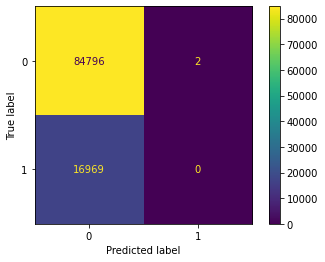

In [21]:
plot_confusion_matrix(clf, X_test, y_test)

In [242]:
# save the model to disk
filename = '/Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/LogisticRegression/clf_model.sav'
pickle.dump(clf, open(filename, 'wb')) 

# load the model from disk
clf = pickle.load(open('/Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/LogisticRegression/clf_model.sav', 'rb'))
clf.predict_proba(X_test)

array([[0.91735974, 0.08264026],
       [0.87795632, 0.12204368],
       [0.73197581, 0.26802419],
       ...,
       [0.80434811, 0.19565189],
       [0.84601577, 0.15398423],
       [0.91751556, 0.08248444]])

### 2.3 Random Forest

In [22]:
# construct model
rf = RandomForestClassifier(random_state=0)
name = "RandomForest"
model_pipelineBR = Pipeline([(name, rf)])

# fit model & calculate cross val scores
_ = model_pipelineBR.fit(X_train, y_train)
cross_val_scores = cross_val_score(model_pipelineBR, X_train, y_train, cv=5)

# prediction
score_out_of_sample = model_pipelineBR.score(X_test, y_test)

In [23]:
# make prediction
y_pred = rf.predict(X_test)

# calculate metrics
y_pred_proba = rf.predict_proba(X_test)
roc_auc = roc_auc_score(y_test, y_pred_proba[:,1])
mse = mean_squared_error(y_test, y_pred)
acc = accuracy_score(y_test, y_pred)
loss = log_loss(y_test, y_pred_proba)

# save result
result = [name, acc, roc_auc, mse, loss]
dfResult.loc[-1] = result  # adding a row
dfResult.index = dfResult.index + 1  # shifting index
dfResult = dfResult.sort_index()  # sorting by indexb

In [24]:
dfResult

,Model Name,Accuracy,ROC AUC,MSE,Log Loss
0,RandomForest,0.916790,0.880920,0.083210,0.263431
1,LogisticRegression,0.833237,0.629758,0.166763,0.437109


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


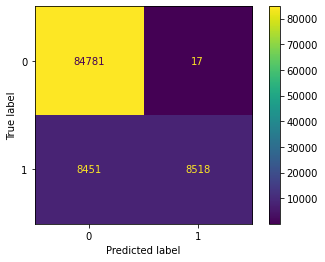

In [25]:
plot_confusion_matrix(rf, X_test, y_test)

In [243]:
# save the model to disk
filename = '/Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/RandomForest/rf_model.sav'
pickle.dump(rf, open(filename, 'wb')) 

# load the model from disk
rf_test = pickle.load(open('/Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/RandomForest/rf_model.sav', 'rb'))
rf_test.predict_proba(X_test)

array([[0.97, 0.03],
       [0.89, 0.11],
       [0.94, 0.06],
       ...,
       [0.91, 0.09],
       [0.75, 0.25],
       [0.96, 0.04]])

### 2.4 XGBoost (Gradient Boosting)

In [26]:
import xgboost as xgb

In [27]:
xgbr = xgb.XGBClassifier() 
name = "XGBoost"

_ = xgbr.fit(X_train, y_train)
cross_val_scores = cross_val_score(xgbr, X_train, y_train, cv=5)
score_out_of_sample = xgbr.score(X_test, y_test)  

In [28]:
# print result
# make prediction
y_pred = xgbr.predict(X_test)

# calculate metrics
y_pred_proba = xgbr.predict_proba(X_test)
roc_auc = roc_auc_score(y_test, y_pred_proba[:,1])
mse = mean_squared_error(y_test, y_pred)
acc = accuracy_score(y_test, y_pred)
loss = log_loss(y_test, y_pred_proba)

# save result
result = [name, acc, roc_auc, mse, loss]
dfResult.loc[-1] = result  # adding a row
dfResult.index = dfResult.index + 1  # shifting index
dfResult = dfResult.sort_index()  # sorting by indexb

In [29]:
dfResult

,Model Name,Accuracy,ROC AUC,MSE,Log Loss
0,XGBoost,0.924986,0.888541,0.075014,0.231517
1,RandomForest,0.916790,0.880920,0.083210,0.263431
2,LogisticRegression,0.833237,0.629758,0.166763,0.437109


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


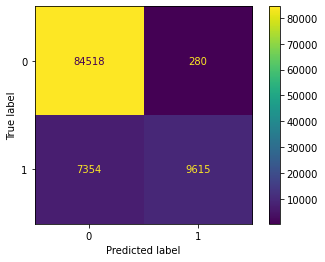

In [30]:
plot_confusion_matrix(xgbr, X_test, y_test)

In [237]:
xgbr.save_model('/Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/XGB/xgbr.json')

In [239]:
xgbr = xgb.XGBClassifier() # or which ever sklearn booster you're are using

xgbr.load_model("/Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/XGB/xgbr.json")
xgbr.predict_proba(X_test)

array([[0.9797126 , 0.02028738],
       [0.77749056, 0.22250943],
       [0.816201  , 0.18379906],
       ...,
       [0.89577305, 0.10422692],
       [0.81406426, 0.18593575],
       [0.9938329 , 0.0061671 ]], dtype=float32)

### 2.5 Simple NN

In [18]:
from tensorflow import keras
from tensorflow.keras import layers

In [19]:
X_traint, X_testt, y_traint, y_testt = train_test_split(X_train, y_train, test_size=0.20, random_state=42)
X_traint.shape[1]

120

In [33]:
# Set model0 equal to a Keras Sequential model
model0 = None
num_cases = 1
input_shape = X_traint.shape[1]

model0 = keras.Sequential([layers.Dense(8, input_shape=(input_shape, ), activation='relu'),
                           layers.Dense(24, activation='relu'),
                           layers.Dense(num_cases, activation='sigmoid', name="dense_head"),
#                            layers.Dropout(0.5)
                          ])

model0.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 8)                 968       
                                                                 
 dense_1 (Dense)             (None, 24)                216       
                                                                 
 dense_head (Dense)          (None, 1)                 25        
                                                                 
Total params: 1,209
Trainable params: 1,209
Non-trainable params: 0
_________________________________________________________________


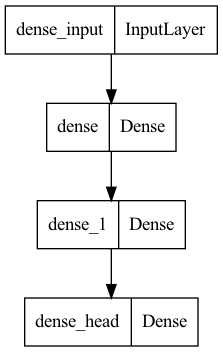

In [34]:
from tensorflow.keras.utils import plot_model
plot_model(model0)

In [35]:
model_name0 = "Simple NN"

_ = model0.compile(loss='binary_crossentropy',
                   optimizer='adam',
                   metrics=[keras.metrics.BinaryAccuracy(),
                            keras.metrics.MeanSquaredError(), 
                            keras.metrics.AUC(curve="ROC")])


history0 = model0.fit(X_traint, y_traint,
#              batch_size=batch_size,
              epochs=10,
#              verbose=1,
#              callbacks=callbacks,
              validation_data=(X_testt, y_testt))

score0 = model0.evaluate(X_test, y_test)

Epoch 1/10
5937/5937 [==============================] - 9s 1ms/step - loss: 176.2234 - binary_accuracy: 0.7460 - mean_squared_error: 0.2433 - auc: 0.5033 - val_loss: 0.4948 - val_binary_accuracy: 0.8323 - val_mean_squared_error: 0.1480 - val_auc: 0.5094
Epoch 2/10
5937/5937 [==============================] - 8s 1ms/step - loss: 0.9387 - binary_accuracy: 0.8299 - mean_squared_error: 0.1426 - auc: 0.4995 - val_loss: 0.7442 - val_binary_accuracy: 0.8326 - val_mean_squared_error: 0.1395 - val_auc: 0.5000
Epoch 3/10
5937/5937 [==============================] - 8s 1ms/step - loss: 2.4002 - binary_accuracy: 0.8336 - mean_squared_error: 0.1388 - auc: 0.4990 - val_loss: 0.4518 - val_binary_accuracy: 0.8326 - val_mean_squared_error: 0.1394 - val_auc: 0.5000
Epoch 4/10
5937/5937 [==============================] - 9s 1ms/step - loss: 0.4911 - binary_accuracy: 0.8336 - mean_squared_error: 0.1388 - auc: 0.5013 - val_loss: 0.4519 - val_binary_accuracy: 0.8326 - val_mean_squared_error: 0.1394 - val_au

In [36]:
for k, mName in enumerate(model0.metrics_names):
    print(mName, ": ", score0[k])

loss :  0.45068487524986267
binary_accuracy :  0.8332563638687134
mean_squared_error :  0.13894085586071014
auc :  0.5000059008598328


In [37]:
y_pred = model0.predict(X_test)
y_pred[y_pred <= 0.5] = 0.
y_pred[y_pred > 0.5] = 1.

In [38]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, y_pred)

array([[84798,     0],
       [16969,     0]])

In [39]:
# save result
model_name0 = "Simple NN"
acc = score0[1]
roc_auc = score0[3]
mse = score0[2]
loss = score0[0]
result = [model_name0, acc, roc_auc, mse, loss]
dfResult.loc[-1] = result  # adding a row
dfResult.index = dfResult.index + 1  # shifting index
dfResult = dfResult.sort_index()  # sorting by indexb
dfResult

,Model Name,Accuracy,ROC AUC,MSE,Log Loss
0,Simple NN,0.833256,0.500006,0.138941,0.450685
1,XGBoost,0.924986,0.888541,0.075014,0.231517
2,RandomForest,0.916790,0.880920,0.083210,0.263431
3,LogisticRegression,0.833237,0.629758,0.166763,0.437109


In [40]:
# remove row by index
# dfResult = dfResult.drop([0, 1]).reset_index(drop=True)
# dfResult

In [235]:
model0.save('/Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/NN')

INFO:tensorflow:Assets written to: /Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/NN/assets


INFO:tensorflow:Assets written to: /Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/NN/assets


In [236]:
NN = keras.models.load_model('/Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/NN/')
NN.predict(X_test)

array([[0.16673651],
       [0.16673651],
       [0.16673651],
       ...,
       [0.16673651],
       [0.16673651],
       [0.16673651]], dtype=float32)

### 2.6 CNN

In [20]:
X_CNN = X.values.reshape((-1, 120, 1))
X_trainC, X_testC, y_trainC, y_testC = train_test_split(X_CNN, y, test_size=0.3, random_state=42)
X_traintC, X_testtC, y_traintC, y_testtC = train_test_split(X_trainC, y_trainC, test_size=0.20, random_state=42)
X_traintC.shape

(189964, 120, 1)

In [21]:
X_traintC[0].shape

(120, 1)

In [43]:
# Set model1 equal to a Keras Sequential model
num_conv_features1 = 32
num_conv_features2 = 64

# YOUR CODE HERE
input_cov = X_traintC[0].shape

modelCNN = keras.Sequential([layers.Conv1D(num_conv_features1, kernel_size=5,
                                         activation='relu', input_shape=input_cov, 
                                         padding="same", name='CNN_1'),
                           layers.Conv1D(num_conv_features1, kernel_size=5,
                                         activation='relu', padding="same", name='CNN_2'),
                           layers.MaxPooling1D(pool_size=2),
                           layers.Flatten(),
                           layers.Dropout(0.5),
                           layers.Dense(1, activation='sigmoid', name='dense_head')
                              ])

In [44]:
# Train the model using the API
model_name = "CNN"

# YOUR CODE HERE
_ = modelCNN.compile(loss='binary_crossentropy',
                   optimizer='adam',
                   metrics=[keras.metrics.BinaryAccuracy(),
                            keras.metrics.MeanSquaredError(), 
                            keras.metrics.AUC(curve="ROC")])

historyCNN = modelCNN.fit(X_traintC, y_traintC,
#              batch_size=batch_size,
              epochs=10,
#              verbose=1,
#              callbacks=callbacks,
              validation_data=(X_testtC, y_testtC))

scoreCNN = modelCNN.evaluate(X_testC, y_testC)


Epoch 1/10
5937/5937 [==============================] - 38s 6ms/step - loss: 33.4292 - binary_accuracy: 0.8188 - mean_squared_error: 0.1447 - auc_1: 0.6460 - val_loss: 0.3933 - val_binary_accuracy: 0.8344 - val_mean_squared_error: 0.1217 - val_auc_1: 0.7729
Epoch 2/10
5937/5937 [==============================] - 34s 6ms/step - loss: 0.3992 - binary_accuracy: 0.8389 - mean_squared_error: 0.1210 - auc_1: 0.7457 - val_loss: 0.3879 - val_binary_accuracy: 0.8382 - val_mean_squared_error: 0.1179 - val_auc_1: 0.7905
Epoch 3/10
5937/5937 [==============================] - 35s 6ms/step - loss: 0.4160 - binary_accuracy: 0.8428 - mean_squared_error: 0.1185 - auc_1: 0.7573 - val_loss: 0.3792 - val_binary_accuracy: 0.8414 - val_mean_squared_error: 0.1165 - val_auc_1: 0.7881
Epoch 4/10
5937/5937 [==============================] - 34s 6ms/step - loss: 0.3813 - binary_accuracy: 0.8516 - mean_squared_error: 0.1130 - auc_1: 0.7729 - val_loss: 0.3501 - val_binary_accuracy: 0.8632 - val_mean_squared_error

In [45]:
for k, mName in enumerate(modelCNN.metrics_names):
    print(mName, ": ", scoreCNN[k])

loss :  0.30107903480529785
binary_accuracy :  0.8897678256034851
mean_squared_error :  0.08771124482154846
auc_1 :  0.8415713310241699


In [46]:
y_pred = modelCNN.predict(X_testC)
y_pred[y_pred <= 0.5] = 0.
y_pred[y_pred > 0.5] = 1.

confusion_matrix(y_testC, y_pred)

array([[84647,   151],
       [11067,  5902]])

In [47]:
# save result
model_name = "CNN1"
acc = scoreCNN[1]
roc_auc = scoreCNN[3]
mse = scoreCNN[2]
loss = scoreCNN[0]
result = [model_name, acc, roc_auc, mse, loss]
dfResult.loc[-1] = result  # adding a row
dfResult.index = dfResult.index + 1  # shifting index
dfResult = dfResult.sort_index()  # sorting by indexb
dfResult

,Model Name,Accuracy,ROC AUC,MSE,Log Loss
0,CNN1,0.889768,0.841571,0.087711,0.301079
1,Simple NN,0.833256,0.500006,0.138941,0.450685
2,XGBoost,0.924986,0.888541,0.075014,0.231517
3,RandomForest,0.916790,0.880920,0.083210,0.263431
4,LogisticRegression,0.833237,0.629758,0.166763,0.437109


In [231]:
modelCNN.save('/Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/CNN1')

INFO:tensorflow:Assets written to: /Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/CNN1/assets


INFO:tensorflow:Assets written to: /Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/CNN1/assets


In [232]:
modelCNN = keras.models.load_model('/Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/CNN1/')
modelCNN.predict(X_testC)

array([[0.03598011],
       [0.16630387],
       [0.09901592],
       ...,
       [0.12811428],
       [0.07951504],
       [0.01678264]], dtype=float32)

### 2.7 CNN2

In [48]:
# Set model1 equal to a Keras Sequential model
num_conv_features1 = 32
num_conv_features2 = 64

# YOUR CODE HERE
input_cov = X_traintC[0].shape

modelCNN2 = keras.Sequential([layers.Conv1D(num_conv_features1, kernel_size=5,
                                         activation='relu', input_shape=input_cov, 
                                         padding="same", name='CNN_1'),
                           layers.Conv1D(num_conv_features1, kernel_size=5,
                                         activation='relu', padding="same", name='CNN_2'),
                           layers.MaxPooling1D(pool_size=2),
                           layers.Conv1D(num_conv_features2, kernel_size=5,
                                         activation='relu', padding="same", name='CNN_3'),
                           layers.Conv1D(num_conv_features2, kernel_size=5,
                                         activation='relu', padding="same", name='CNN_4'),
                           layers.MaxPooling1D(pool_size=2),
                           layers.Flatten(),
                           layers.Dropout(0.5),
                           layers.Dense(1, activation='sigmoid', name='dense_head')
                              ])

In [49]:
# Train the model using the API
model_name = "CNN2"

# YOUR CODE HERE
_ = modelCNN2.compile(loss='binary_crossentropy',
                   optimizer='adam',
                   metrics=[keras.metrics.BinaryAccuracy(),
                            keras.metrics.MeanSquaredError(), 
                            keras.metrics.AUC(curve="ROC")])

historyCNN2 = modelCNN2.fit(X_traintC, y_traintC,
#              batch_size=batch_size,
              epochs=10,
#              verbose=1,
#              callbacks=callbacks,
              validation_data=(X_testtC, y_testtC))

scoreCNN2 = modelCNN2.evaluate(X_testC, y_testC)

Epoch 1/10
5937/5937 [==============================] - 98s 16ms/step - loss: 9.9283 - binary_accuracy: 0.8236 - mean_squared_error: 0.1447 - auc_2: 0.6153 - val_loss: 0.4088 - val_binary_accuracy: 0.8326 - val_mean_squared_error: 0.1266 - val_auc_2: 0.7407
Epoch 2/10
5937/5937 [==============================] - 96s 16ms/step - loss: 0.3983 - binary_accuracy: 0.8370 - mean_squared_error: 0.1223 - auc_2: 0.7445 - val_loss: 0.3699 - val_binary_accuracy: 0.8498 - val_mean_squared_error: 0.1131 - val_auc_2: 0.7905
Epoch 3/10
5937/5937 [==============================] - 94s 16ms/step - loss: 0.3873 - binary_accuracy: 0.8501 - mean_squared_error: 0.1139 - auc_2: 0.7758 - val_loss: 0.3569 - val_binary_accuracy: 0.8575 - val_mean_squared_error: 0.1080 - val_auc_2: 0.8078
Epoch 4/10
5937/5937 [==============================] - 96s 16ms/step - loss: 0.3646 - binary_accuracy: 0.8704 - mean_squared_error: 0.1016 - auc_2: 0.8039 - val_loss: 0.3356 - val_binary_accuracy: 0.8779 - val_mean_squared_er

In [50]:
for k, mName in enumerate(modelCNN2.metrics_names):
    print(mName, ": ", scoreCNN2[k])

loss :  0.2749854326248169
binary_accuracy :  0.90415358543396
mean_squared_error :  0.07861465215682983
auc_2 :  0.8550907969474792


In [51]:
y_pred = modelCNN2.predict(X_testC)
y_pred[y_pred <= 0.5] = 0.
y_pred[y_pred > 0.5] = 1.

confusion_matrix(y_testC, y_pred)

array([[84428,   370],
       [ 9384,  7585]])

In [52]:
# save result
model_name = "CNN2"
acc = scoreCNN2[1]
roc_auc = scoreCNN2[3]
mse = scoreCNN2[2]
loss = scoreCNN2[0]
result = [model_name, acc, roc_auc, mse, loss]
dfResult.loc[-1] = result  # adding a row
dfResult.index = dfResult.index + 1  # shifting index
dfResult = dfResult.sort_index()  # sorting by indexb
dfResult

,Model Name,Accuracy,ROC AUC,MSE,Log Loss
0,CNN2,0.904154,0.855091,0.078615,0.274985
1,CNN1,0.889768,0.841571,0.087711,0.301079
2,Simple NN,0.833256,0.500006,0.138941,0.450685
3,XGBoost,0.924986,0.888541,0.075014,0.231517
4,RandomForest,0.916790,0.880920,0.083210,0.263431
5,LogisticRegression,0.833237,0.629758,0.166763,0.437109


In [233]:
modelCNN2.save('/Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/CNN2')

INFO:tensorflow:Assets written to: /Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/CNN2/assets


INFO:tensorflow:Assets written to: /Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/CNN2/assets


In [234]:
modelCNN2 = keras.models.load_model('/Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/CNN2/')
modelCNN2.predict(X_testC)

array([[0.05143258],
       [0.1295627 ],
       [0.07457757],
       ...,
       [0.35805827],
       [0.23221293],
       [0.01123369]], dtype=float32)

## Load Trained Models

In [234]:
import pickle
import xgboost as xgb
from tensorflow import keras

clf = pickle.load(open('/Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/LogisticRegression/clf_model.sav', 'rb'))
rf = pickle.load(open('/Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/RandomForest/rf_model.sav', 'rb'))
xgbr = xgb.XGBClassifier() # or which ever sklearn booster you're are using
xgbr.load_model("/Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/XGB/xgbr.json")
NN = keras.models.load_model('/Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/NN/')
modelCNN = keras.models.load_model('/Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/CNN1/')
modelCNN2 = keras.models.load_model('/Users/caichengyun/Coding/NYU/FRE-7801-MRM/models/CNN2/')

## 3. Open-Source Tools (LIME, SHAP)

### 3-1 LIME

In [223]:
import lime
import lime.lime_tabular
import warnings
import tensorflow as tf
from lime import submodular_pick
from sklearn import datasets

### Logistice Regression

In [25]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.astype(int).values, mode='classification', training_labels=y_train, 
                                                   feature_names=X_train.columns.tolist(), class_names=['Not Default', 'Default'])

# asking for explanation for LIME model

i = np.random.randint(0, X_test.shape[0])
exp = explainer.explain_instance(X_test.iloc[i].astype(int).values, clf.predict_proba, num_features=5)

exp.show_in_notebook(show_table=True)

X does not have valid feature names, but LogisticRegression was fitted with feature names


In [26]:
exp.as_list()

[('FLAG_DOCUMENT_21 <= 0.00', -0.2807508095653484),
 ('AMT_GOODS_PRICE <= 238500.00', 0.24138186612797735),
 ('AMT_CREDIT <= 270000.00', -0.22814025512580235),
 ('FLAG_EMAIL > 0.00', -0.039496981636076414),
 ('-19530.00 < DAYS_BIRTH <= -15582.00', -0.023800937077434314)]

### Random Forest

In [27]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.astype(int).values, mode='classification', training_labels=y_train, 
                                                   feature_names=X_train.columns.tolist(), class_names=['Not Default', 'Default'])

# asking for explanation for LIME model

i = np.random.randint(0, X_test.shape[0])
exp = explainer.explain_instance(X_test.iloc[i].astype(int).values, rf.predict_proba, num_features=5, top_labels=1)

exp.show_in_notebook(show_table=True)

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


In [28]:
exp.as_list()

[('DEF_30_CNT_SOCIAL_CIRCLE <= 0.00', -0.0486854619667598),
 ('FLAG_OWN_CAR <= 0.00', 0.03294752052342323),
 ('DEF_60_CNT_SOCIAL_CIRCLE <= 0.00', -0.025501988580757484),
 ('DAYS_EMPLOYED <= -2688.00', -0.018621655752388715),
 ('HOUSETYPE_MODE <= 0.00', 0.013846980396929963)]

### XGBoost

In [29]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.astype(int).values, mode='classification', 
                                                   training_labels=y_train, feature_names=X_train.columns.tolist(), 
                                                   class_names=['Not Default', 'Default'])

# asking for explanation for LIME model

i = np.random.randint(0, X_test.shape[0])
exp = explainer.explain_instance(X_test.iloc[i].astype(int).values, xgbr.predict_proba, num_features=5)

exp.show_in_notebook(show_table=True)

In [30]:
exp.as_list()

[('0.00 < FLAG_OWN_CAR <= 1.00', -0.02774427178794072),
 ('2.00 < CNT_FAM_MEMBERS <= 3.00', -0.011126979905574394),
 ('AMT_REQ_CREDIT_BUREAU_QRT <= 0.00', -0.007341537766299166),
 ('3.00 < NAME_INCOME_TYPE <= 7.00', 0.0065073957874935565),
 ('10.00 < OCCUPATION_TYPE <= 18.00', 0.005428048901923058)]

### Simple NN

In [40]:
def prob(data):
    return np.array(list(zip(1-NN.predict(data)[:, 0], NN.predict(data)[:, 0])))

In [41]:
# changed x to x_train
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.astype(int).values, feature_names=list(X_train.columns), 
                                                   class_names=['Not Default', 'Default'], mode='classification')

# added top_labels=1
i = np.random.randint(0, X_test.shape[0])
exp = explainer.explain_instance(X_test.iloc[i].astype(int).values, prob, num_features=5)

exp.show_in_notebook(show_table=True, show_all=False)

In [43]:
exp.as_list(label=1)

[('ELEVATORS_AVG <= 0.00', 0.06899546015355244),
 ('AMT_GOODS_PRICE <= 238500.00', -0.04332062016243365),
 ('AMT_CREDIT <= 270000.00', 0.022142177168458704),
 ('-1206.00 < DAYS_EMPLOYED <= -319.00', -0.005240638445039037),
 ('DAYS_ID_PUBLISH > -1716.00', 0.0036434751732775084)]

### CNN1

In [34]:
def prob(data):
    return np.array(list(zip(1-modelCNN.predict(data)[:, 0], modelCNN.predict(data)[:, 0])))

In [37]:
# changed x to x_train
explainer = lime.lime_tabular.RecurrentTabularExplainer(X_trainC, class_names=['Not Default', 'Default'], 
                                                        feature_names=["feature"], discretize_continuous=False, mode='classification')

# added top_labels=1
i = np.random.randint(0, X_testC.shape[0])
exp = explainer.explain_instance(np.expand_dims(X_testC[i],axis=0), prob, num_features=10, top_labels=1)

exp.show_in_notebook(show_table=True, show_all=False)

In [39]:
exp.as_list(label=0)

[('feature_t-16', 0.05501057063816846),
 ('feature_t-42', 0.0504207542519069),
 ('feature_t-94', -0.04942543204519081),
 ('feature_t-93', 0.04541605724124035),
 ('feature_t-90', 0.03407017985858323),
 ('feature_t-13', 0.01952334364359274),
 ('feature_t-113', -0.010139433382322998),
 ('feature_t-82', 0.009496316043934748),
 ('feature_t-1', 0.00751739204728601),
 ('feature_t-44', -0.0067535509772165625)]

### CNN2

In [44]:
def prob(data):
    return np.array(list(zip(1-modelCNN2.predict(data)[:, 0], modelCNN2.predict(data)[:, 0])))

In [45]:
# changed x to x_train
explainer = lime.lime_tabular.RecurrentTabularExplainer(X_trainC, class_names=['Not Default', 'Default'], 
                                                        feature_names=["feature"], discretize_continuous=False)

# added top_labels=1
i = np.random.randint(0, X_testC.shape[0])
exp = explainer.explain_instance(np.expand_dims(X_testC[i],axis=0), prob, num_features=10, top_labels=1)

exp.show_in_notebook(show_table=True, show_all=False)

In [46]:
exp.as_list(label=0)

[('feature_t-19', -0.09661642149572813),
 ('feature_t-42', -0.08640508234330775),
 ('feature_t-18', -0.06481823493299022),
 ('feature_t-90', 0.04413545218725461),
 ('feature_t-91', 0.03164255850802636),
 ('feature_t-17', -0.029644304256362122),
 ('feature_t-15', 0.013624647191514596),
 ('feature_t-65', 0.012270093769723246),
 ('feature_t-53', -0.01062146826137999),
 ('feature_t-5', -0.007812014600136999)]

120(total feature amount) - FeatureNumber - 1 = index of the feature

In [33]:
test = X_test.iloc[i]
test[test == -1757.00]

Series([], Name: 52004, dtype: float64)

In [34]:
arr = X_test.columns.array
np.where(arr == 'DAYS_LAST_PHONE_CHANGE')

(array([77]),)

In [35]:
test[28]

0.7039416147692028

### 3-2 SHAP

In [24]:
import shap
shap.initjs()

### Logistic regression

In [132]:
K = 100
X_train_summary = shap.sample(X_train, K)

In [141]:
ex = shap.KernelExplainer(clf.predict, X_train_summary)
shap_values = ex.shap_values(X.iloc[7,:])
# shap.force_plot(ex.expected_value, shap_values, X.iloc[0,:])

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 


In [142]:
feature_names = X_train.columns
# vals = np.abs(rf_resultX.values).mean(0)

shap_importance = pd.DataFrame(list(zip(feature_names, shap_values)),
                                  columns=['col_name','feature_importance_vals'])
shap_importance.sort_values(by=['feature_importance_vals'],
                               ascending=False, inplace=True)
shap_importance.head()

,col_name,feature_importance_vals
2,AMT_CREDIT,0.368714
0,CNT_CHILDREN,0.000000
76,DEF_60_CNT_SOCIAL_CIRCLE,0.000000
88,FLAG_DOCUMENT_12,0.000000
87,FLAG_DOCUMENT_11,0.000000


### Random Forest

In [153]:
explainer = shap.Explainer(rf)
shap_values = explainer(X.iloc[11])

In [148]:
feature_names = X_train.columns
# vals = np.abs(rf_resultX.values).mean(0)

shap_importance = pd.DataFrame(list(zip(feature_names, shap_values.values[:,1])),
                                  columns=['col_name','feature_importance_vals'])
shap_importance.sort_values(by=['feature_importance_vals'],
                               ascending=False, inplace=True)
shap_importance.head()

,col_name,feature_importance_vals
108,NAME_TYPE_SUITE,0.017054
1,AMT_INCOME_TOTAL,0.012882
7,DAYS_EMPLOYED,0.010742
106,FLAG_OWN_CAR,0.010653
119,EMERGENCYSTATE_MODE,0.010096


### XGBoost

In [277]:
explainer = shap.Explainer(xgbr)
shap_values = explainer(X.iloc[1].to_frame().T)


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


In [281]:
shap_values.values.shape

(1, 120)

In [177]:
feature_names = X_train.columns
# vals = np.abs(rf_resultX.values).mean(0)

shap_importance = pd.DataFrame(list(zip(feature_names, shap_values.values.flatten())),
                                  columns=['col_name','feature_importance_vals'])
shap_importance.sort_values(by=['feature_importance_vals'],
                               ascending=False, inplace=True)
shap_importance.head()

,col_name,feature_importance_vals
51,FLOORSMAX_MODE,0.532490
2,AMT_CREDIT,0.283915
27,EXT_SOURCE_1,0.223504
9,DAYS_ID_PUBLISH,0.197322
106,FLAG_OWN_CAR,0.164918


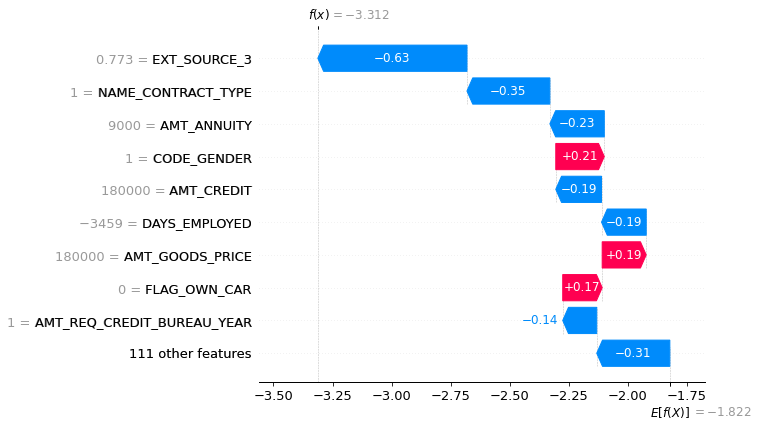

In [112]:
# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[4])

In [103]:
# visualize the first prediction's explanation with a force plot
shap.plots.force(shap_values[0])

In [32]:
# visualize all the training set predictions
shap.plots.force(shap_values[:100])

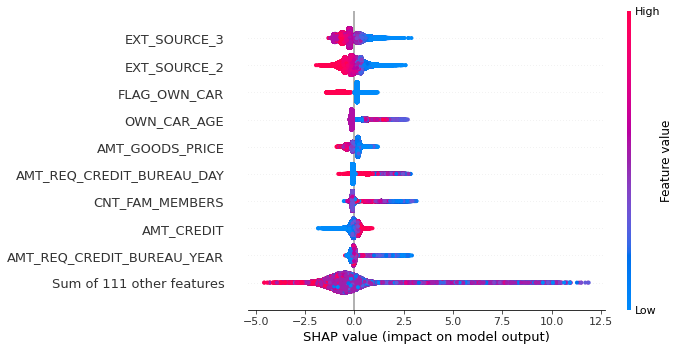

In [25]:
# summarize the effects of all the features
shap.plots.beeswarm(shap_values)

### NN

In [290]:
background = X.values[np.random.choice(X.shape[0], 100, replace=False)]
explainer = shap.DeepExplainer(NN, background) #X_test.iloc[1][np.newaxis, ...]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


In [304]:
shap_values = explainer.shap_values(X_test[:1000].values)

shap_values

[array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]])]

In [305]:
feature_names = X_train.columns
vals = np.abs(shap_values).mean(0)

shap_importance = pd.DataFrame(list(zip(feature_names, np.array(shap_values).flatten())),
                                  columns=['col_name','feature_importance_vals'])
shap_importance.sort_values(by=['feature_importance_vals'],
                               ascending=False, inplace=True)
shap_importance.head()

,col_name,feature_importance_vals
0,CNT_CHILDREN,0.0
1,AMT_INCOME_TOTAL,0.0
88,FLAG_DOCUMENT_12,0.0
87,FLAG_DOCUMENT_11,0.0
86,FLAG_DOCUMENT_10,0.0


### CNN1

In [282]:
background = X_trainC[np.random.choice(X_trainC.shape[0], 100, replace=False)]

explainer = shap.DeepExplainer(modelCNN, background)
shap_values = explainer.shap_values(X_testC[0][np.newaxis, ...])

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


In [287]:
feature_names = X_train.columns
# vals = np.abs(rf_resultX.values).mean(0)

shap_importance = pd.DataFrame(list(zip(feature_names, np.array(shap_values).flatten())),
                                  columns=['col_name','feature_importance_vals'])
shap_importance.sort_values(by=['feature_importance_vals'],
                               ascending=False, inplace=True)
shap_importance.head()

,col_name,feature_importance_vals
28,EXT_SOURCE_2,0.030141
73,OBS_30_CNT_SOCIAL_CIRCLE,0.002998
17,CNT_FAM_MEMBERS,0.002669
75,OBS_60_CNT_SOCIAL_CIRCLE,0.002366
79,FLAG_DOCUMENT_3,0.002336


### CNN2

In [288]:
background = X_trainC[np.random.choice(X_trainC.shape[0], 100, replace=False)]

explainer = shap.DeepExplainer(modelCNN2, background)
shap_values = explainer.shap_values(X_testC[0][np.newaxis, ...])

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


In [289]:
feature_names = X_train.columns
# vals = np.abs(rf_resultX.values).mean(0)

shap_importance = pd.DataFrame(list(zip(feature_names, np.array(shap_values).flatten())),
                                  columns=['col_name','feature_importance_vals'])
shap_importance.sort_values(by=['feature_importance_vals'],
                               ascending=False, inplace=True)
shap_importance.head()

,col_name,feature_importance_vals
28,EXT_SOURCE_2,0.033420
102,AMT_REQ_CREDIT_BUREAU_QRT,0.005969
106,FLAG_OWN_CAR,0.004729
104,NAME_CONTRACT_TYPE,0.002774
110,NAME_EDUCATION_TYPE,0.002107


## 4. Fidelity Test

### 4-1. Nearest neighbor test
- whether applicants that look similar to the rejected applicant with regard to the four identified drivers for an adverse decision are also rejected by the model  
- compare fidelity of different diagnostic tools by evaluating how many of the neighbors are accepted — with lower acceptance rates corresponding to higher fidelity.

### 4-1-1 LIME

### Logistic Regression

In [941]:
def getDriver(drivers):
    if len(drivers)>=5:
        length = 5
    else:
        length = len(drivers)
    
    return drivers[:length]

In [942]:
def getNeighbor(drivers):
    if len(drivers)>=5:
        length = 5
    else:
        length = len(drivers)
    Logic = (abs(X[drivers[:length]]) <= abs(X[drivers[:length]].iloc[i])*10/9) & (abs(X[drivers[:length]]) >= abs(X[drivers[:length]].iloc[i])*9/10)
    neighbors = X[Logic.all(1)]
    return neighbors

In [943]:
### LIME
def getLR_LIME(explainer, i):
    # asking for explanation for LIME model
    exp = explainer.explain_instance(X.iloc[i].astype(int).values, clf.predict_proba, num_features=121)
    expList = exp.as_list()
    
    # get top default drivers
    expAry = np.array(expList)
    df = pd.DataFrame(expAry, columns = ['Column Name','LIME Value'])
    df['Column Name']= df['Column Name'].str.split(' ').str.get(-3)
    df['LIME Value'] = df['LIME Value'].astype(float)
    
    return df['Column Name'][df['LIME Value']>0]


In [944]:
def getLR_SHAP(ex, i):
    shap_values = ex.shap_values(X.iloc[i,:])
    feature_names = X_train.columns

    shap_importance = pd.DataFrame(list(zip(feature_names, shap_values)),
                                      columns=['col_name','feature_importance_vals'])
    shap_importance.sort_values(by=['feature_importance_vals'],
                                   ascending=False, inplace=True)
    df = shap_importance
    
    return df['col_name'][df['feature_importance_vals']>0]

In [945]:
def perturbation(X, drivers):
    test = X.copy()
    for i in range(len(drivers)):
        if test[drivers.iloc[i]] == 0:
            test[drivers.iloc[i]] = 1
        elif test[drivers.iloc[i]] == 1:
            test[drivers.iloc[i]] = 0
        elif test[drivers.iloc[i]] > 0:
            test[drivers.iloc[i]] /= 2
        elif test[drivers.iloc[i]] < 0:
            test[drivers.iloc[i]] *= 2
    return test

In [946]:
# LIME: draw a default
fidelityList = []
fidelityListS = []

consistancyListT = []

perturbationList = []
toAcceptList = []
perturbationListS = []
toAcceptListS = []

explainer = lime.lime_tabular.LimeTabularExplainer(X_train.astype(int).values, mode='classification', training_labels=y_train, 
                                                       feature_names=X_train.columns.tolist(), class_names=['Not Default', 'Default'])
ex = shap.KernelExplainer(clf.predict, X_train_summary)

for times in range(100):
    notDefault = True
    while notDefault:
        i = np.random.randint(0, X.shape[0])
        defProb = clf.predict_proba(X.iloc[i][np.newaxis, ...])[0][1]
        notDefault = defProb < 0.2

    # get drivers and neighbors from LIME & SHAP
    drivers = getLR_LIME(explainer, i)
    df_neighbors = getNeighbor(drivers)
    
    driversS = getLR_SHAP(ex, i)
    df_neighborsS = getNeighbor(driversS)
    
    # calculate consistancy across tools
    a = getDriver(drivers)
    b = getDriver(driversS)
    intersection = set(a) & set(b)
    consistancyT = len(intersection)/len(a)
    consistancyListT.append(consistancyT)
    
    # calculate fidelity
    test = clf.predict_proba(df_neighbors)[:,1] > 0.2
    fidelity = test.sum()/test.shape[0]
    fidelityList.append(fidelity)
    
    test = clf.predict_proba(df_neighborsS)[:,1] > 0.2
    fidelity = test.sum()/test.shape[0]
    fidelityListS.append(fidelity)
    
    # perturbation
    defProbOri = clf.predict_proba(X.iloc[i][np.newaxis, ...])[0][1]
    afterPert = perturbation(X.iloc[i].copy(), a)
    defProbPert = clf.predict_proba(afterPert[np.newaxis, ...])[0][1]
    perturbationList.append(defProbOri-defProbPert)
    toAcceptList.append(defProbPert<0.2) # append True if default prob < 0.2 (change from reject to accept)

    afterPert = perturbation(X.iloc[i].copy(), b)
    defProbPert = clf.predict_proba(afterPert[np.newaxis, ...])[0][1]
    perturbationListS.append(defProbOri-defProbPert)
    toAcceptListS.append(defProbPert<0.2) # append True if default prob < 0.2 (change from reject to accept)
    
    
    if times % 10 == 0:
        print(times, "% done...")

X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but Logistic

0 % done...


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version. 

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

10 % done...


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

20 % done...


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

30 % done...


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

40 % done...


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

50 % done...


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

60 % done...


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

70 % done...


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

80 % done...


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression wa

90 % done...


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version. 

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a fut

In [947]:
## LIME
import statistics
statistics.mean(fidelityList) 

0.35123079467940166

In [948]:
## SHAP
statistics.mean(fidelityListS) 

0.8438229786576203

In [949]:
#Benchmark
test = clf.predict_proba(X)[:,1] > 0.2
fidelity = test.sum()/test.shape[0]
fidelity

0.2937182915073565

In [950]:
# Perturbation
PertLIME = statistics.mean(perturbationList) 
PertSHAP = statistics.mean(perturbationListS)

toAcceptList = np.array(toAcceptList)
toAcceptListS = np.array(toAcceptListS)
toAcptLIME = toAcceptList.sum()/toAcceptList.shape[0]
toAcptSHAP = toAcceptListS.sum()/toAcceptListS.shape[0]

print("LIME Dif: ", PertLIME)
print("SHAP Dif: ", PertSHAP)
print("LIME to Acpt: ", toAcptLIME)
print("SHAP to Acpt: ", toAcptSHAP)

LIME Dif:  0.0031151916983227896
SHAP Dif:  0.033035732227215155
LIME to Acpt:  0.13
SHAP to Acpt:  0.41


In [951]:
# Tool Consistancy 
statistics.mean(consistancyListT) 

0.09000000000000001

### Random Forest

In [952]:
### LIME
def getRF_LIME(explainer, i):
    
    # asking for explanation for LIME model
    exp = explainer.explain_instance(X.iloc[i].astype(int).values, rf.predict_proba, num_features=121)
    expList = exp.as_list()
    
    # get top default drivers
    expAry = np.array(expList)
    df = pd.DataFrame(expAry, columns = ['Column Name','LIME Value'])
    df['Column Name']= df['Column Name'].str.split(' ').str.get(-3)
    df['LIME Value'] = df['LIME Value'].astype(float)
    
    return df['Column Name'][df['LIME Value']>0]

In [953]:
def getRF_SHAP(ex, i):
    shap_values = ex(X.iloc[i])
    feature_names = X_train.columns

    shap_importance = pd.DataFrame(list(zip(feature_names, shap_values.values[:,1])),
                                  columns=['col_name','feature_importance_vals'])
    shap_importance.sort_values(by=['feature_importance_vals'],
                                   ascending=False, inplace=True)
    df = shap_importance
    
    return df['col_name'][df['feature_importance_vals']>0]

In [954]:
# draw a default
fidelityListRF = []
fidelityListRFS = []
consistancyListTRF = []

perturbationList = []
toAcceptList = []
perturbationListS = []
toAcceptListS = []

explainer = lime.lime_tabular.LimeTabularExplainer(X_train.astype(int).values, mode='classification', training_labels=y_train, 
                                                       feature_names=X_train.columns.tolist(), class_names=['Not Default', 'Default'])
ex = shap.Explainer(rf)

for times in range(100):
    notDefault = True
    while notDefault:
        i = np.random.randint(0, X.shape[0])
        defProb = rf.predict_proba(X.iloc[i][np.newaxis, ...])[0][1]
        notDefault = defProb < 0.2

    # get drivers and neighbors
    drivers = getRF_LIME(explainer, i)
    df_neighbors = getNeighbor(drivers)
    
    driversS = getRF_SHAP(ex, i)
    df_neighborsS = getNeighbor(driversS)
    
    # calculate consistancy across tools
    a = getDriver(drivers)
    b = getDriver(driversS)
    intersection = set(a) & set(b)
    consistancyT = len(intersection)/len(a)
    consistancyListTRF.append(consistancyT)

    # calculate fidelity
    test = rf.predict_proba(df_neighbors)[:,1] > 0.2
    fidelity = test.sum()/test.shape[0]
    fidelityListRF.append(fidelity)
    
    test = rf.predict_proba(df_neighborsS)[:,1] > 0.2
    fidelity = test.sum()/test.shape[0]
    fidelityListRFS.append(fidelity)
    
    # perturbation
    defProbOri = rf.predict_proba(X.iloc[i][np.newaxis, ...])[0][1]
    afterPert = perturbation(X.iloc[i].copy(), a)
    defProbPert = rf.predict_proba(afterPert[np.newaxis, ...])[0][1]
    perturbationList.append(defProbOri-defProbPert)
    toAcceptList.append(defProbPert<0.2) # append True if default prob < 0.2 (change from reject to accept)

    afterPert = perturbation(X.iloc[i].copy(), b)
    defProbPert = rf.predict_proba(afterPert[np.newaxis, ...])[0][1]
    perturbationListS.append(defProbOri-defProbPert)
    toAcceptListS.append(defProbPert<0.2) # append True if default prob < 0.2 (change from reject to accept)
    
    if times % 10 == 0:
        print(times, "% done...")

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

0 % done...


X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional

10 % done...


X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomFor

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

20 % done...


X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

30 % done...


X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

40 % done...


X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

50 % done...


X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

60 % done...


X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

70 % done...


X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

80 % done...


X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

90 % done...


X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomFor

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Conver

In [955]:
statistics.mean(fidelityListRF) 

0.3676141009096331

In [956]:
## SHAP
statistics.mean(fidelityListRFS) 

0.8459110094926331

In [957]:
#Benchmark
test = rf.predict_proba(X)[:,1] > 0.2
fidelity = test.sum()/test.shape[0]
fidelity

0.17774443360267433

In [958]:
# Perturbation
PertLIME = statistics.mean(perturbationList) 
PertSHAP = statistics.mean(perturbationListS)

toAcceptList = np.array(toAcceptList)
toAcceptListS = np.array(toAcceptListS)
toAcptLIME = toAcceptList.sum()/toAcceptList.shape[0]
toAcptSHAP = toAcceptListS.sum()/toAcceptListS.shape[0]

print("LIME Dif: ", PertLIME)
print("SHAP Dif: ", PertSHAP)
print("LIME to Acpt: ", toAcptLIME)
print("SHAP to Acpt: ", toAcptSHAP)

LIME Dif:  0.1086
SHAP Dif:  0.1169
LIME to Acpt:  0.02
SHAP to Acpt:  0.07


In [959]:
# Tool Consistancy 
statistics.mean(consistancyListTRF) 

0.12400000000000001

### XGBoost

In [960]:
### LIME
def getXGB_LIME(explainer, i):
    # asking for explanation for LIME model
    exp = explainer.explain_instance(X.iloc[i].astype(int).values, xgbr.predict_proba, num_features=121)
    expList = exp.as_list()
    
    # get top default drivers
    expAry = np.array(expList)
    df = pd.DataFrame(expAry, columns = ['Column Name','LIME Value'])
    df['Column Name']= df['Column Name'].str.split(' ').str.get(-3)
    df['LIME Value'] = df['LIME Value'].astype(float)
    
    return df['Column Name'][df['LIME Value']>0]

In [961]:
def getXGB_SHAP(ex, i):
    shap_values = ex(X.iloc[i].to_frame().T)
    feature_names = X_train.columns

    shap_importance = pd.DataFrame(list(zip(feature_names, shap_values.values.flatten())),
                                  columns=['col_name','feature_importance_vals'])
    shap_importance.sort_values(by=['feature_importance_vals'],
                                ascending=False, inplace=True)
    df = shap_importance
    
    return df['col_name'][df['feature_importance_vals']>0]

In [962]:
# draw a default
fidelityListXGB = []
fidelityListXGBS = []
consistancyListTXGB = []

perturbationList = []
toAcceptList = []
perturbationListS = []
toAcceptListS = []

explainer = lime.lime_tabular.LimeTabularExplainer(X_train.astype(int).values, mode='classification', 
                                                   training_labels=y_train, feature_names=X_train.columns.tolist(), 
                                                   class_names=['Not Default', 'Default'])
ex = shap.Explainer(xgbr)

for times in range(100):
    notDefault = True
    while notDefault:
        i = np.random.randint(0, X.shape[0])
        defProb = xgbr.predict_proba(X.iloc[i][np.newaxis, ...])[0][1]
        notDefault = defProb < 0.2

    # get drivers and neighbors
    drivers = getXGB_LIME(explainer, i)
    df_neighbors = getNeighbor(drivers)
    
    driversS = getXGB_SHAP(ex, i)
    df_neighborsS = getNeighbor(driversS)
    
    # calculate consistancy across tools
    a = getDriver(drivers)
    b = getDriver(driversS)
    intersection = set(a) & set(b)
    consistancyT = len(intersection)/len(a)
    consistancyListTXGB.append(consistancyT)

    # calculate fidelity
    test = xgbr.predict_proba(df_neighbors)[:,1] > 0.2
    fidelity = test.sum()/test.shape[0]
    fidelityListXGB.append(fidelity)
    
    test = xgbr.predict_proba(df_neighborsS)[:,1] > 0.2
    fidelity = test.sum()/test.shape[0]
    fidelityListXGBS.append(fidelity)
    
    # perturbation
    defProbOri = xgbr.predict_proba(X.iloc[i][np.newaxis, ...])[0][1]
    afterPert = perturbation(X.iloc[i].copy(), a)
    defProbPert = xgbr.predict_proba(afterPert[np.newaxis, ...])[0][1]
    perturbationList.append(defProbOri-defProbPert)
    toAcceptList.append(defProbPert<0.2) # append True if default prob < 0.2 (change from reject to accept)

    afterPert = perturbation(X.iloc[i].copy(), b)
    defProbPert = xgbr.predict_proba(afterPert[np.newaxis, ...])[0][1]
    perturbationListS.append(defProbOri-defProbPert)
    toAcceptListS.append(defProbPert<0.2) # append True if default prob < 0.2 (change from reject to accept)
    
    if times % 10 == 0:
        print(times, "% done...")

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.


0 % done...


ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for mul

10 % done...


ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for mul

20 % done...


ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for mul

30 % done...


ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for mul

40 % done...


ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for mul

50 % done...


ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for mul

60 % done...


ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for mul

70 % done...


ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for mul

80 % done...


ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for mul

90 % done...


ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
Support for mul

In [963]:
statistics.mean(fidelityListXGB)

0.40261652357624017

In [964]:
## SHAP
statistics.mean(fidelityListXGBS)

0.9339337371095999

In [965]:
#Benchmark
test = xgbr.predict_proba(X)[:,1] > 0.2
fidelity = test.sum()/test.shape[0]
fidelity

0.17969300430690135

In [966]:
# Perturbation
PertLIME = statistics.mean(perturbationList) 
PertSHAP = statistics.mean(perturbationListS)

toAcceptList = np.array(toAcceptList)
toAcceptListS = np.array(toAcceptListS)
toAcptLIME = toAcceptList.sum()/toAcceptList.shape[0]
toAcptSHAP = toAcceptListS.sum()/toAcceptListS.shape[0]

print("LIME Dif: ", PertLIME)
print("SHAP Dif: ", PertSHAP)
print("LIME to Acpt: ", toAcptLIME)
print("SHAP to Acpt: ", toAcptSHAP)

LIME Dif:  0.009508513
SHAP Dif:  -0.029189538
LIME to Acpt:  0.1
SHAP to Acpt:  0.08


In [967]:
# Tool Consistancy 
statistics.mean(consistancyListTXGB) 

0.10600000000000001

### NN (NaN, since all predicted default probabilities are the same, 0.167)

In [968]:
def prob(data):
    return np.array(list(zip(1-NN.predict(data)[:, 0], NN.predict(data)[:, 0])))

In [969]:
### LIME
def getNN_LIME(explainer, i):
    # asking for explanation for LIME model
    exp = explainer.explain_instance(X.iloc[i].astype(int).values, prob, num_features=5)
    expList = exp.as_list()
    
    # get top default drivers
    expAry = np.array(expList)
    df = pd.DataFrame(expAry, columns = ['Column Name','LIME Value'])
    df['Column Name']= df['Column Name'].str.split(' ').str.get(-3)
    df['LIME Value'] = df['LIME Value'].astype(float)
    
    return df['Column Name'][df['LIME Value']>0]

In [970]:
# draw a default
# fidelityListNN = []

# explainer = lime.lime_tabular.LimeTabularExplainer(X_train.astype(int).values, feature_names=list(X_train.columns), 
#                                                    class_names=['Not Default', 'Default'], mode='classification')

# for times in range(100):
#     notDefault = True
#     while notDefault:
#         i = np.random.randint(0, X.shape[0])
#         defProb = NN.predict(X.iloc[i][np.newaxis, ...])[0][0]
#         notDefault = defProb < 0.2

#     # get drivers and neighbors
#     drivers = getNN_LIME(explainer, i)
#     df_neighbors = getNeighbor(drivers)

#     # calculate fidelity
#     test = NN.predict_proba(df_neighbors)[:,1] > 0.2
#     fidelity = test.sum()/test.shape[0]
#     fidelityListNN.append(fidelity)
    
#     if times % 10 == 0:
#         print(times, "% done...")

In [971]:
## Benchmark
test = NN.predict(X)[:,0]> 0.2
fidelity = test.sum()/test.shape[0]
fidelity

0.0

### CNN1

In [972]:
def probCNN1(data):
    return np.array(list(zip(1-modelCNN.predict(data)[:, 0], modelCNN.predict(data)[:, 0])))

In [973]:
### LIME
def getCNN1_LIME(explainer, i, prob):
    # asking for explanation for LIME model
    exp = explainer.explain_instance(np.expand_dims(X_CNN[i],axis=0), prob, num_features=120, top_labels=1)
    try:
        expList = exp.as_list(label=0)
    except:
        expList = exp.as_list(label=1)
    
    # get top default drivers
    expAry = np.array(expList)
    df = pd.DataFrame(expAry, columns = ['Column Name','LIME Value'])
    df['LIME Value'] = df['LIME Value'].astype(float)
    df['Column Number']= df['Column Name'].str.split('-').str.get(-1).astype(int)
    df['Column Number'] = 120-df['Column Number']-1
    df['Column Name'] = X.columns[df['Column Number'].tolist()]
    
    return df['Column Name'][df['LIME Value']>0]

In [974]:
def getCNN1_SHAP(ex, i):
    shap_values = ex.shap_values(X_CNN[i][np.newaxis, ...])
    feature_names = X_train.columns

    shap_importance = pd.DataFrame(list(zip(feature_names, np.array(shap_values).flatten())),
                                   columns=['col_name','feature_importance_vals'])
    shap_importance.sort_values(by=['feature_importance_vals'],
                                ascending=False, inplace=True)
    df = shap_importance
    
    return df['col_name'][df['feature_importance_vals']>0]

In [975]:
# draw a default
fidelityListCNN1 = []
fidelityListCNN1S = []
consistancyListTNN1 = []

perturbationList = []
toAcceptList = []
perturbationListS = []
toAcceptListS = []

explainer = lime.lime_tabular.RecurrentTabularExplainer(X_trainC, class_names=['Not Default', 'Default'], 
                                                        feature_names=["feature"], discretize_continuous=False, 
                                                        mode='classification')
background = X_trainC[np.random.choice(X_trainC.shape[0], 100, replace=False)]
ex = shap.DeepExplainer(modelCNN, background)

for times in range(100):
    notDefault = True
    while notDefault:
        i = np.random.randint(0, X.shape[0])
        defProb = modelCNN.predict(X_CNN[i][np.newaxis, ...])[0][0]
        notDefault = defProb < 0.2

    # get drivers and neighbors
    drivers = getCNN1_LIME(explainer, i, probCNN1)
    df_neighbors = getNeighbor(drivers).values.reshape((-1, 120, 1))
    
    driversS = getCNN1_SHAP(ex, i)
    df_neighborsS = getNeighbor(driversS).values.reshape((-1, 120, 1))
    
    # calculate consistancy across tools
    a = getDriver(drivers)
    b = getDriver(driversS)
    intersection = set(a) & set(b)
    consistancyT = len(intersection)/len(a)
    consistancyListTNN1.append(consistancyT)

    # calculate fidelity
    test = modelCNN.predict(df_neighbors)[:,0]> 0.2
    fidelity = test.sum()/test.shape[0]
    fidelityListCNN1.append(fidelity)
    
    test = modelCNN.predict(df_neighborsS)[:,0] > 0.2
    fidelity = test.sum()/test.shape[0]
    fidelityListCNN1S.append(fidelity)
    
    # perturbation
    defProbOri = modelCNN.predict(X_CNN[i][np.newaxis, ...])[0][0]
    
    afterPert = perturbation(X.iloc[i].copy(), a).values.reshape((120, 1))
    defProbPert = modelCNN.predict(afterPert[np.newaxis, ...])[0][0]
    perturbationList.append(defProbOri-defProbPert)
    toAcceptList.append(defProbPert<0.2) # append True if default prob < 0.2 (change from reject to accept)

    afterPert = perturbation(X.iloc[i].copy(), b).values.reshape((120, 1))
    defProbPert = modelCNN.predict(afterPert[np.newaxis, ...])[0][0]
    perturbationListS.append(defProbOri-defProbPert)
    toAcceptListS.append(defProbPert<0.2) # append True if default prob < 0.2 (change from reject to accept)
    
    if times % 10 == 0:
        print(times, "% done...")

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


0 % done...
10 % done...
20 % done...
30 % done...
40 % done...
50 % done...
60 % done...
70 % done...
80 % done...
90 % done...


In [976]:
statistics.mean(fidelityListCNN1)

0.47966757147103023

In [977]:
## SHAP
statistics.mean(fidelityListCNN1S)

0.8569043025123134

In [978]:
## Benchmark
test = modelCNN.predict(X_CNN)[:,0]> 0.2
fidelity = test.sum()/test.shape[0]
fidelity

0.2013660630322826

In [979]:
# Perturbation
PertLIME = statistics.mean(perturbationList) 
PertSHAP = statistics.mean(perturbationListS)

toAcceptList = np.array(toAcceptList)
toAcceptListS = np.array(toAcceptListS)
toAcptLIME = toAcceptList.sum()/toAcceptList.shape[0]
toAcptSHAP = toAcceptListS.sum()/toAcceptListS.shape[0]

print("LIME Dif: ", PertLIME)
print("SHAP Dif: ", PertSHAP)
print("LIME to Acpt: ", toAcptLIME)
print("SHAP to Acpt: ", toAcptSHAP)

LIME Dif:  -0.136578
SHAP Dif:  -0.017997293
LIME to Acpt:  0.37
SHAP to Acpt:  0.16


In [980]:
# Tool Consistancy 
statistics.mean(consistancyListTNN1) 

0.26

### CNN2

In [981]:
def probCNN2(data):
    return np.array(list(zip(1-modelCNN2.predict(data)[:, 0], modelCNN2.predict(data)[:, 0])))

In [982]:
### LIME
def getCNN2_LIME(explainer, i, prob):
    # asking for explanation for LIME model
    exp = explainer.explain_instance(np.expand_dims(X_CNN[i],axis=0), prob, num_features=120, top_labels=1)
    try:
        expList = exp.as_list(label=0)
    except:
        expList = exp.as_list(label=1)
    
    # get top default drivers
    expAry = np.array(expList)
    df = pd.DataFrame(expAry, columns = ['Column Name','LIME Value'])
    df['LIME Value'] = df['LIME Value'].astype(float)
    df['Column Number']= df['Column Name'].str.split('-').str.get(-1).astype(int)
    df['Column Number'] = 120-df['Column Number']-1
    df['Column Name'] = X.columns[df['Column Number'].tolist()]
    
    return df['Column Name'][df['LIME Value']>0]

In [983]:
def getCNN2_SHAP(ex, i):
    shap_values = ex.shap_values(X_CNN[i][np.newaxis, ...])
    feature_names = X_train.columns

    shap_importance = pd.DataFrame(list(zip(feature_names, np.array(shap_values).flatten())),
                                   columns=['col_name','feature_importance_vals'])
    shap_importance.sort_values(by=['feature_importance_vals'],
                                ascending=False, inplace=True)
    df = shap_importance
    
    return df['col_name'][df['feature_importance_vals']>0]

In [984]:
# draw a default
fidelityListCNN2 = []
fidelityListCNN2S = []
consistancyListTNN2 = []

perturbationList = []
toAcceptList = []
perturbationListS = []
toAcceptListS = []

explainer = lime.lime_tabular.RecurrentTabularExplainer(X_trainC, class_names=['Not Default', 'Default'], 
                                                        feature_names=["feature"], discretize_continuous=False, 
                                                        mode='classification')

background = X_trainC[np.random.choice(X_trainC.shape[0], 100, replace=False)]
ex = shap.DeepExplainer(modelCNN2, background)

for times in range(100):
    notDefault = True
    while notDefault:
        i = np.random.randint(0, X.shape[0])
        defProb = modelCNN2.predict(X_CNN[i][np.newaxis, ...])[0][0]
        notDefault = defProb < 0.2

    # get drivers and neighbors
    drivers = getCNN2_LIME(explainer, i, probCNN2)
    df_neighbors = getNeighbor(drivers).values.reshape((-1, 120, 1))
    
    driversS = getCNN2_SHAP(ex, i)
    df_neighborsS = getNeighbor(driversS).values.reshape((-1, 120, 1))
    
    # calculate consistancy across tools
    a = getDriver(drivers)
    b = getDriver(driversS)
    intersection = set(a) & set(b)
    consistancyT = len(intersection)/len(a)
    consistancyListTNN2.append(consistancyT)

    # calculate fidelity
    test = modelCNN2.predict(df_neighbors)[:,0]> 0.2
    fidelity = test.sum()/test.shape[0]
    fidelityListCNN2.append(fidelity)
    
    test = modelCNN2.predict(df_neighborsS)[:,0] > 0.2
    fidelity = test.sum()/test.shape[0]
    fidelityListCNN2S.append(fidelity)
    
    # perturbation
    defProbOri = modelCNN2.predict(X_CNN[i][np.newaxis, ...])[0][0]
    
    afterPert = perturbation(X.iloc[i].copy(), a).values.reshape((120, 1))
    defProbPert = modelCNN2.predict(afterPert[np.newaxis, ...])[0][0]
    perturbationList.append(defProbOri-defProbPert)
    toAcceptList.append(defProbPert<0.2) # append True if default prob < 0.2 (change from reject to accept)

    afterPert = perturbation(X.iloc[i].copy(), b).values.reshape((120, 1))
    defProbPert = modelCNN2.predict(afterPert[np.newaxis, ...])[0][0]
    perturbationListS.append(defProbOri-defProbPert)
    toAcceptListS.append(defProbPert<0.2) # append True if default prob < 0.2 (change from reject to accept)
    
    if times % 10 == 0:
        print(times, "% done...")

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


0 % done...
10 % done...
20 % done...
30 % done...
40 % done...
50 % done...
60 % done...
70 % done...
80 % done...
90 % done...


In [985]:
statistics.mean(fidelityListCNN2)

0.5605211092965333

In [986]:
## SHAP
statistics.mean(fidelityListCNN2S)

0.8839549491740062

In [987]:
## Benchmark
test = modelCNN2.predict(X_CNN)[:,0]> 0.2
fidelity = test.sum()/test.shape[0]
fidelity

0.20342960235597232

In [988]:
# Perturbation
PertLIME = statistics.mean(perturbationList) 
PertSHAP = statistics.mean(perturbationListS)

toAcceptList = np.array(toAcceptList)
toAcceptListS = np.array(toAcceptListS)
toAcptLIME = toAcceptList.sum()/toAcceptList.shape[0]
toAcptSHAP = toAcceptListS.sum()/toAcceptListS.shape[0]

print("LIME Dif: ", PertLIME)
print("SHAP Dif: ", PertSHAP)
print("LIME to Acpt: ", toAcptLIME)
print("SHAP to Acpt: ", toAcptSHAP)

LIME Dif:  0.081985325
SHAP Dif:  0.07538221
LIME to Acpt:  0.06
SHAP to Acpt:  0.29


In [989]:
# Tool Consistancy 
statistics.mean(consistancyListTNN2)

0.32

### 4-2. Perturbation test
whether changing – or perturbing – the four features identified as drivers of the adverse decision has a greater impact on the model’s prediction than (a) changing other, randomly selected, features in the model or (b) changing other features that are closely correlated with the identified driver.

Implemented in fidelity code!

## 5. Consistency Test

### 5-1 Across tools
Consistency across tools asks how often two participating companies – or open‐source tools – identify the same features as drivers of rejection decisions. 

Implemented in fidelity code!

### 5-2 Across models
Consistency across models asks how often a given model diagnostic tool identifies the same features as drivers of rejection decisions across different underwriting models.

In [990]:
def getSimilarity(a, b):
    intersection = set(a) & set(b)
    consistancyT = len(intersection)/len(a)
    return consistancyT

In [991]:
def getMatrix(LimeList):
    list_of_pairs = [(LimeList[p1], LimeList[p2]) for p1 in range(len(LimeList)) for p2 in range(p1+1,len(LimeList))]
    resList = []
    for listp in list_of_pairs:
        a = getDriver(listp[0])
        b = getDriver(listp[1])
        resList.append(getSimilarity(a, b))
    return resList

In [992]:
# init explainers
#LR
explainerCLF = lime.lime_tabular.LimeTabularExplainer(X_train.astype(int).values, mode='classification', training_labels=y_train, 
                                                       feature_names=X_train.columns.tolist(), class_names=['Not Default', 'Default'])
exCLF = shap.KernelExplainer(clf.predict, X_train_summary)

#RF
explainerRF = lime.lime_tabular.LimeTabularExplainer(X_train.astype(int).values, mode='classification', training_labels=y_train, 
                                                       feature_names=X_train.columns.tolist(), class_names=['Not Default', 'Default'])
exRF = shap.Explainer(rf)

#XGB
explainerXGB = lime.lime_tabular.LimeTabularExplainer(X_train.astype(int).values, mode='classification', 
                                                   training_labels=y_train, feature_names=X_train.columns.tolist(), 
                                                   class_names=['Not Default', 'Default'])
exXGB = shap.Explainer(xgbr)

#CNN1
explainerCNN1 = lime.lime_tabular.RecurrentTabularExplainer(X_trainC, class_names=['Not Default', 'Default'], 
                                                        feature_names=["feature"], discretize_continuous=False, 
                                                        mode='classification')
background = X_trainC[np.random.choice(X_trainC.shape[0], 100, replace=False)]
exCNN1 = shap.DeepExplainer(modelCNN, background)

#CNN2
explainerCNN2 = lime.lime_tabular.RecurrentTabularExplainer(X_trainC, class_names=['Not Default', 'Default'], 
                                                        feature_names=["feature"], discretize_continuous=False, 
                                                        mode='classification')
exCNN2 = shap.DeepExplainer(modelCNN2, background)


X does not have valid feature names, but LogisticRegression was fitted with feature names
Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


In [993]:
resultMatrixLIME = []
resultMatrixSHAP = []
# LimeList = []

for times in range(100):
    notDefault = True
    while notDefault:
        i = np.random.randint(0, X.shape[0])
        defProb = clf.predict_proba(X.iloc[i][np.newaxis, ...])[0][1]
        notDefault = defProb < 0.2

#     LIME
    LimeList = []
    #CLF
    drivers = getLR_LIME(explainerCLF, i)
    driversCLF = getDriver(drivers)
    LimeList.append(driversCLF.tolist())
    #RF
    drivers = getRF_LIME(explainerRF, i)
    driversRF = getDriver(drivers)
    LimeList.append(driversRF.tolist())
    #XGB
    drivers = getXGB_LIME(explainerXGB, i)
    driversXGB = getDriver(drivers)
    LimeList.append(driversXGB.tolist())
    #CNN1
    drivers = getCNN1_LIME(explainerCNN1, i, probCNN1)
    driversCNN1 = getDriver(drivers)
    LimeList.append(driversCNN1.tolist())
    #CNN2
    drivers = getCNN2_LIME(explainerCNN2, i, probCNN2)
    driversCNN2 = getDriver(drivers)
    LimeList.append(driversCNN2.tolist())
    
    matrix = getMatrix(LimeList)
    resultMatrixLIME.append(matrix)
    
#     SHAP
    SHAPList = []
    #CLF
    drivers = getLR_SHAP(exCLF, i)
    driversCLF = getDriver(drivers)
    SHAPList.append(driversCLF.tolist())
    #RF
    drivers = getRF_SHAP(exRF, i)
    driversRF = getDriver(drivers)
    SHAPList.append(driversRF.tolist())
    #XGB
    drivers = getXGB_SHAP(exXGB, i)
    driversXGB = getDriver(drivers)
    SHAPList.append(driversXGB.tolist())
    #CNN1
    drivers = getCNN1_SHAP(exCNN1, i)
    driversCNN1 = getDriver(drivers)
    SHAPList.append(driversCNN1.tolist())
    #CNN2
    drivers = getCNN2_SHAP(exCNN2, i)
    driversCNN2 = getDriver(drivers)
    SHAPList.append(driversCNN2.tolist())
    
    matrix = getMatrix(SHAPList)
    resultMatrixSHAP.append(matrix)
    
    if times % 10 == 0:
        print(times, "% done...")
    

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression wa

0 % done...


Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression wa

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
ntree_lim

ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before index

10 % done...


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
ntree_lim

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
ntree_lim

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimens

20 % done...


Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression wa

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight param

ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(

30 % done...


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
ntree_lim

ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before index

40 % done...


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
ntree_lim

ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
ntree_lim

50 % done...


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
ntree_lim

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimens

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  C

60 % done...


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
ntree_lim

ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
ntree_lim

70 % done...


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
ntree_lim

X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
ntree_lim

ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names


80 % done...


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
ntree_lim

ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(

ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(

90 % done...


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
ntree_lim

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
ntree_limit is deprecated, use `iteration_range` or model slicing instead.
Support for multi-dimens

(CLF, RF) (CLF, XGB) (CLF, CNN1) (CLF, CNN2) (RF, XGB) (RF, CNN1) (RF, CNN2) (XGB, CNN1) (XGB, CNN2) (CNN1, CNN2)

In [994]:
# LIME
np.mean(resultMatrixLIME, axis=0)

array([0.052, 0.062, 0.004, 0.012, 0.19 , 0.   , 0.008, 0.068, 0.038,
       0.246])

In [995]:
# SHAP
np.mean(resultMatrixSHAP, axis=0)

array([0.12733333, 0.34733333, 0.00333333, 0.01533333, 0.474     ,
       0.36      , 0.414     , 0.256     , 0.338     , 0.576     ])